In [45]:
import os
import matplotlib

import numpy as np
import xarray as xr
import pandas as pd
import rasterio as rio
import geopandas as gp
import rsfuncs as rs

import matplotlib.pyplot as plt
import matplotlib.animation as animation

from affine import Affine
from matplotlib import gridspec
from datetime import datetime, timedelta
from rasterio import features, mask
from IPython.display import HTML
from pandas.plotting import register_matplotlib_converters
from dateutil.relativedelta import relativedelta
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

register_matplotlib_converters()
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [46]:
# Read the shapefile for which to Extract the ET data 
butte = gp.read_file('../shape/SGMA_Wyandotte Subbasin_2018.shp')

butte.bounds

,minx,miny,maxx,maxy
0,-121.667003,39.295774,-121.486101,39.53887


In [47]:
bounds = [str(x[0])[:8] for x in [butte.bounds.maxy.values, butte.bounds.minx.values, butte.bounds.maxx.values, butte.bounds.miny.values]]

'''https://cida.usgs.gov/thredds/ncss/ssebopeta/monthly?var=et&north={}&west={}&east={}&south={}&disableProjSubset=on&horizStride=1&time_start=2000-01-01T00%3A00%3A00Z&time_end=2020-10-01T00%3A00%3A00Z&timeStride=1'''.format(bounds[0],bounds[1],bounds[2],bounds[3])


'https://cida.usgs.gov/thredds/ncss/ssebopeta/monthly?var=et&north=39.53886&west=-121.667&east=-121.486&south=39.29577&disableProjSubset=on&horizStride=1&time_start=2000-01-01T00%3A00%3A00Z&time_end=2020-10-01T00%3A00%3A00Z&timeStride=1'

### Download the ssebop ET data for the cv watershed bbox, and put it in the "../data" folder


https://cida.usgs.gov/thredds/ncss/ssebopeta/monthly?var=et&north=40.152029&west=-122.069444&east=-121.076708&south=39.29562&disableProjSubset=on&horizStride=1&time_start=2000-01-01T00%3A00%3A00Z&time_end=2020-10-01T00%3A00%3A00Z&timeStride=1

In [48]:
# Read the ET nc file 
files = [os.path.join("../data",x) for x in os.listdir("../data") if x.endswith("nc") if "ssebop" in x]
ds = xr.open_dataset(files[0])

In [49]:
def transform_from_latlon(lat, lon):
    lat = np.asarray(lat)
    lon = np.asarray(lon)
    trans = Affine.translation(lon[0], lat[0])
    scale = Affine.scale(lon[1] - lon[0], lat[1] - lat[0])
    return trans * scale

def rasterize(shapes, coords, fill=np.nan, **kwargs):
    """Rasterize a list of (geometry, fill_value) tuples onto the given
    xray coordinates. This only works for 1d latitude and longitude
    arrays.
    """
    transform = transform_from_latlon(coords['lat'], coords['lon'])
    out_shape = (len(coords['lat']), len(coords['lon']))
    raster = features.rasterize(shapes, out_shape=out_shape,
                                fill=fill, transform=transform,
                                dtype=float, **kwargs)
    return xr.DataArray(raster, coords=coords, dims=('lat', 'lon'))

In [50]:
# Rasterize geom
ds['geom'] = rasterize(butte.geometry, ds['et'][0].coords)

# Is there a better way to do this? 
butte_et = ds['et']*ds['geom']

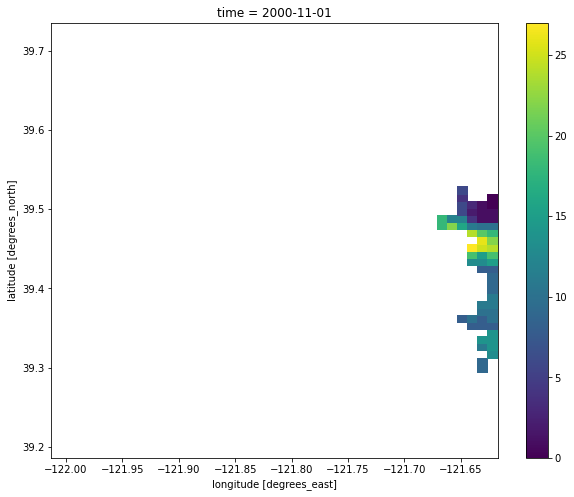

In [51]:
# Sanity check 
plt.figure(figsize=(10,8))
plt.subplot(1,1,1)
butte_et[10].plot()

In [52]:
# Get the timeseries, convert mm to km, sum all pixels to get km^3 (1x1 km pixels)

dt = pd.date_range(ds.time.values[0], ds.time.values[:-14][-1], freq = "MS")
ts= []
for i in butte_et[:-14]:
    ts.append(i.sum()* 1e-6 )

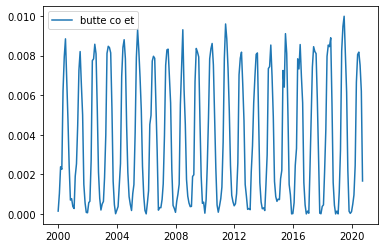

In [53]:
plt.plot(dt,np.array(ts), label = "butte co et") # CHANGED dt to ds.time
plt.legend()

In [54]:
df = pd.DataFrame({'ssebop_et': np.array(ts)}, index = dt) 
df.columns = ['ssebop']
# if not os.path.exists("../data/ssebop_et.csv"):
df.to_csv("../data/wyandotte_ssebop_et.csv")

# Animations

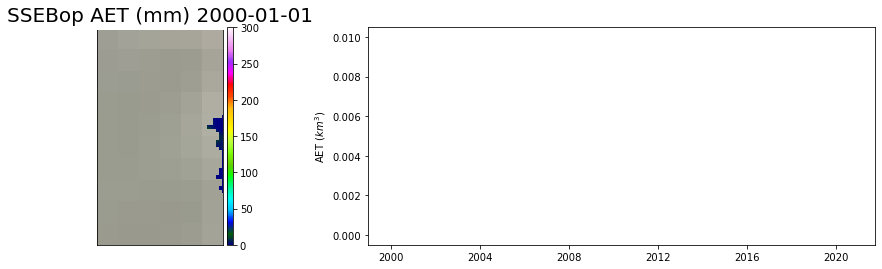

In [55]:
# Setup fig 
fig, ax1 = plt.subplots(figsize=(15,4))
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 2]) 
ax0 = plt.subplot(gs[0])

# get bbox of data
imextent = butte.bounds.iloc[0].values
lllon, lllat = imextent[0], imextent[1]
urlon, urlat = imextent[2], imextent[3]

# Initialize the basemap
m = Basemap(ax = ax0,projection='merc', ellps='WGS84',resolution='f', 
            llcrnrlon=lllon, urcrnrlon=urlon, llcrnrlat=lllat, urcrnrlat=urlat) #  bbox for basemap

# Add stuff to basemap 
# m.etopo(zorder = 0)
m.shadedrelief(zorder = 0)
# m.drawcoastlines(color='gray')
# m.drawcountries(color='gray')
# m.drawstates(color='gray')
# m.drawrivers(color = "blue")
# m.fillcontinents(color='none',lake_color='blue')

# Draw lines of latitude and longitude. Labels are like [left,right,top,bottom]
# parallels = np.arange(0.,90.,2.)
# meridians = np.arange(0.,360.,2.)

# m.drawparallels(parallels,labels=[True,False,True,False]) # [left,right,top,bottom]
# m.drawmeridians(meridians,labels=[True,False,False,True]) # [left,right,top,bottom]

# Plot array 
im = m.imshow(butte_et[0,:,:], cmap='gist_ncar', vmin = 0, vmax = 300)

# Set location of the colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(mappable=im, cax=cax)

######## Time Series Plot
ax1 = plt.subplot(gs[1])
line, = ax1.plot(dt,np.array(ts),color='k')
ax1.set_ylabel("AET $(km^3)$")

###### Animation Functions

def animate(frame):
    im.set_array(butte_et[frame,:,:])
    ax0.set_title("SSEBop AET (mm) " + str(butte_et.coords['time'].values[frame])[:10], fontsize=20,backgroundcolor= 'white')
    line.set_data(dt[:frame],ts[:frame])# CHANGED dt to ds.time.values

# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames= len(dt),       # Could also be iterable or list
    interval=200, # ms between frames
    repeat = True
)

HTML(ani.to_jshtml())


In [56]:
# ani.save('../images/butte_et.gif', writer='pillow')

f = r"../images/wyandotte_et.gif" 
writergif = animation.PillowWriter(fps=5) 
ani.save(f, writer=writergif)

In [57]:
# Load ET data processed using crop coefficient method (split into chunks in the ETkc folder)
ET_dir = "../data/ETkc0125_0125_wyandotte/"

files = [os.path.join(ET_dir,x) for x in os.listdir(ET_dir) if x.endswith(".csv")]
etdfs = [pd.read_csv(x) for x in files]

etcvdfs = [x.ETkc for x in etdfs]
petdfs = [x.petimsum for x in etdfs]
aetdfs = [x.aetimsum for x in etdfs]
kcdfs = [x.kc_mean for x in etdfs]

ETcv = pd.concat(etcvdfs, axis = 1)
aet = pd.concat(aetdfs, axis = 1)
pet = pd.concat(petdfs, axis = 1)
kc = pd.concat(kcdfs, axis = 1)

etcvs = ETcv.sum(axis=1)
pets = pet.sum(axis=1)
aets = aet.sum(axis=1)
kcs = kc.mean(axis = 1)

etdf = pd.DataFrame([etcvs, pets, aets, kcs]).T
etdf.index = pd.to_datetime(etdfs[0][etdfs[0].columns[0]])

etdf.columns = ['MODkc', 'pet', 'aet', "kc"]

# Load SSEBop ET data
ssebop_et =  pd.read_csv("../data/wyandotte_ssebop_et.csv")
ssebop_et = rs.col_to_dt(ssebop_et)

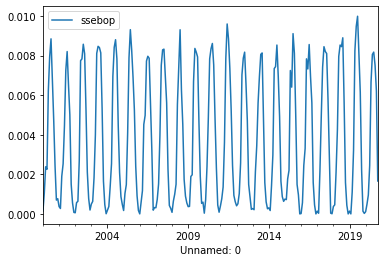

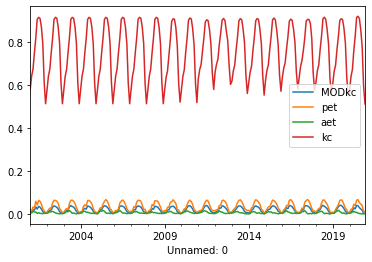

In [58]:
ssebop_et.plot()
etdf.plot()

In [59]:
etdf.to_csv("../data/wyandotte_MODkc.csv")